In [ ]:
import numpy as np
import librosa
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from google.colab import drive
import os
import pandas as pd
import matplotlib.pyplot as plt
import librosa.display

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()
project_id = 'sinuous-vent-453400-h2 '
!gcloud config set project {project_id}
!gsutil ls

Updated property [core/project].
gs://urbansound/


In [ ]:
!gsutil ls gs://urbansound/

ServiceException: 401 Anonymous caller does not have storage.objects.list access to the Google Cloud Storage bucket. Permission 'storage.objects.list' denied on resource (or it may not exist).


In [ ]:
bucket_name = ' urbansound'

In [ ]:
!gsutil ls

gs://urbansound/


In [ ]:
# !gsutil -m cp -r /content/drive/MyDrive/datasets/* gs://urbansound/datasets

Streaming output truncated to the last 5000 lines.
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/165454-0-0-2.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/161005-2-0-4.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/165454-0-0-1.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/164625-1-0-0.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/165454-0-0-6.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/165567-3-4-0.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/165567-3-0-0.wav [Content-Type=audio/x-wav]...
Copying file:///content/drive/MyDrive/datasets/urbansound8k/audio/fold9/165567-3-3-0.wav [Content-Type=audio/x-wav].

In [ ]:
!ls ./drive/MyDrive/datasets/urbansound8k/metadata/

UrbanSound8K.csv


In [ ]:
!ls

drive  sample_data


In [ ]:
# Set the path to your metadata CSV file and audio directory
METADATA_PATH = "./drive/MyDrive/datasets/urbansound8k/metadata/UrbanSound8K.csv"
AUDIO_DIR = "./drive/MyDrive/datasets/urbansound8k/audio/"

# Read the metadata CSV file
metadata = pd.read_csv(METADATA_PATH)

# Dummy Data and Example of Different Features

# Summary Data on the Data Set

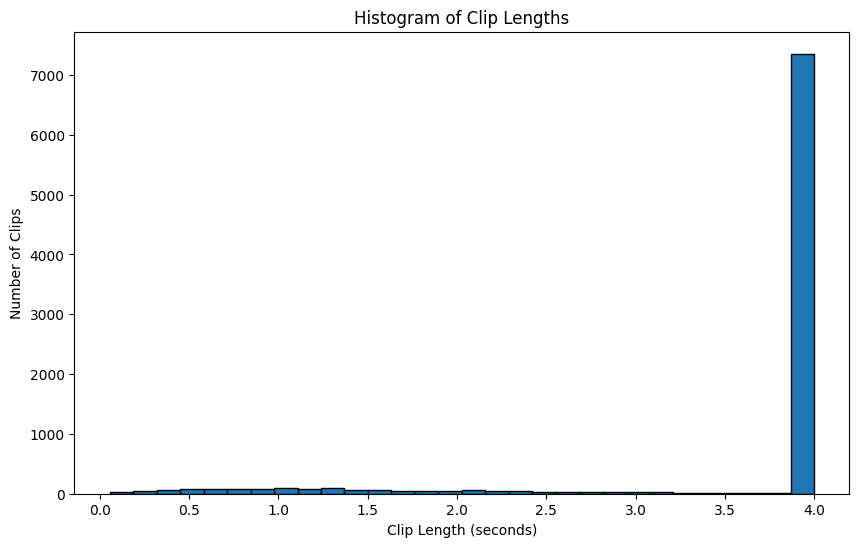

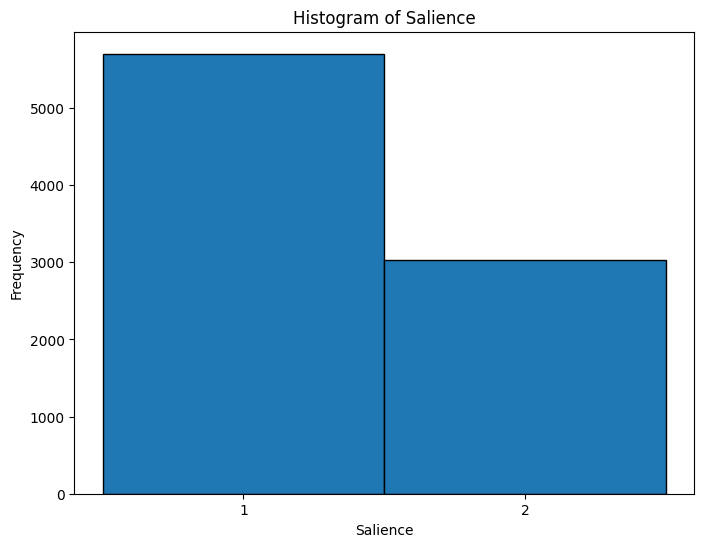

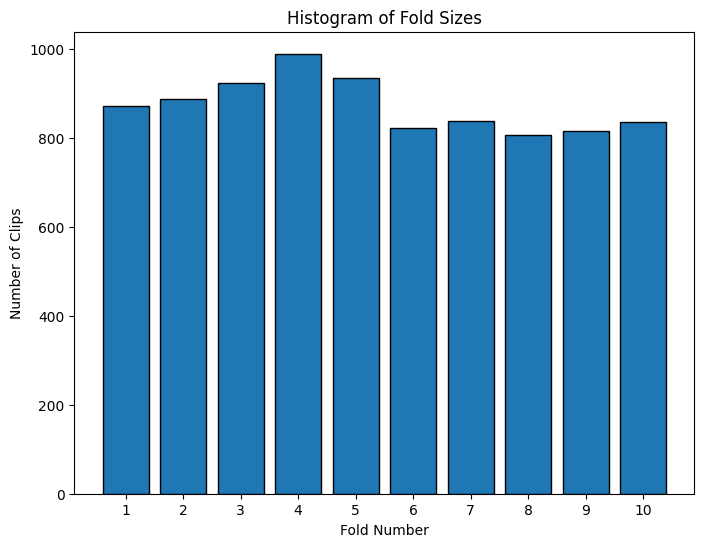

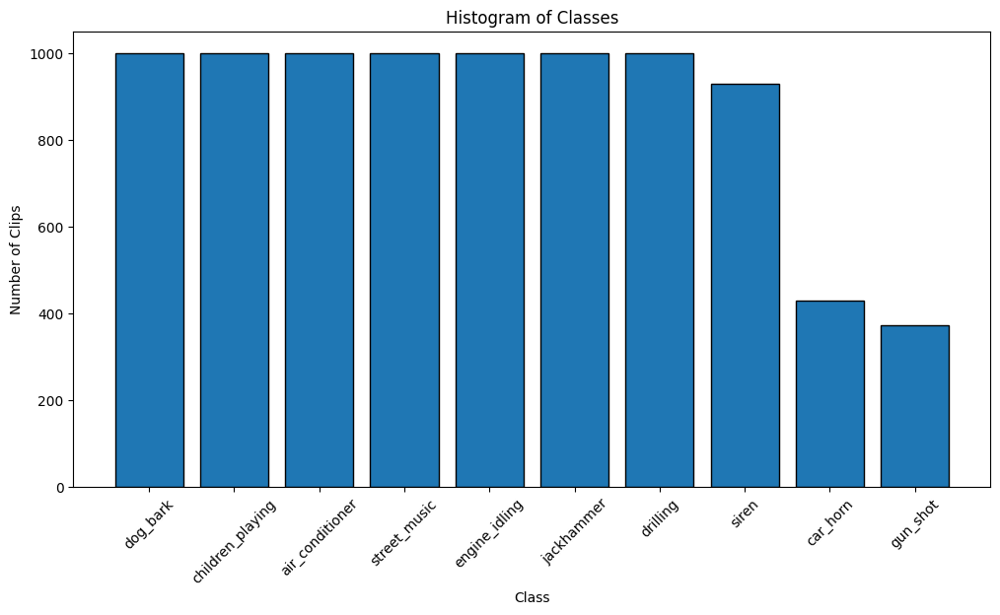

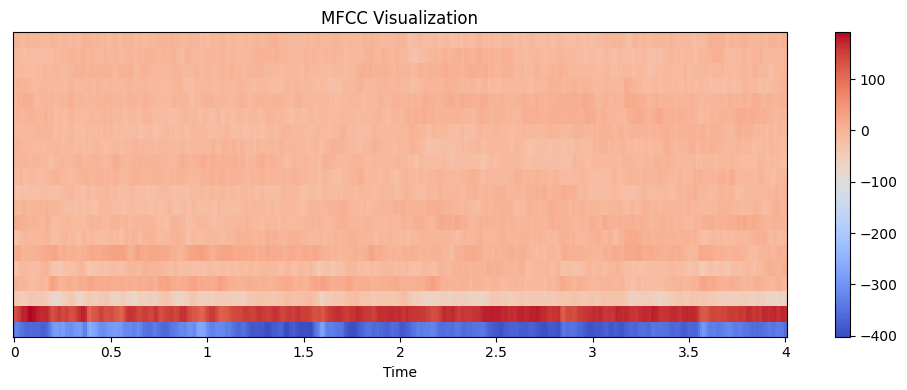

In [ ]:
# Compute clip lengths (assuming the CSV has 'start' and 'end' columns in seconds)
metadata["clip_length"] = metadata["end"] - metadata["start"]

# 1) Plot a histogram of clip lengths
plt.figure(figsize=(10, 6))
plt.hist(metadata["clip_length"], bins=30, edgecolor='black')
plt.title("Histogram of Clip Lengths")
plt.xlabel("Clip Length (seconds)")
plt.ylabel("Number of Clips")
plt.show()

# 2) Plot a histogram of the salience values
# Adjust bins to center the bars on integer salience values
salience_min = metadata["salience"].min()
salience_max = metadata["salience"].max()
bins = np.arange(salience_min, salience_max + 2) - 0.5  # create bins so that integers are centered
plt.figure(figsize=(8, 6))
plt.hist(metadata["salience"], bins=bins, edgecolor='black')
plt.title("Histogram of Salience")
plt.xlabel("Salience")
plt.ylabel("Frequency")
plt.xticks(sorted(metadata["salience"].unique()))
plt.show()

# 3) Plot a histogram of fold sizes (i.e. number of clips per fold)
fold_counts = metadata["fold"].value_counts().sort_index()
plt.figure(figsize=(8, 6))
plt.bar(fold_counts.index.astype(str), fold_counts.values, edgecolor='black')
plt.title("Histogram of Fold Sizes")
plt.xlabel("Fold Number")
plt.ylabel("Number of Clips")
plt.show()

# 4) Plot a histogram of the class distribution
class_counts = metadata["class"].value_counts()
plt.figure(figsize=(12, 6))
plt.bar(class_counts.index, class_counts.values, edgecolor='black')
plt.title("Histogram of Classes")
plt.xlabel("Class")
plt.ylabel("Number of Clips")
plt.xticks(rotation=45)
plt.show()

# # 5) Visualize the MFCC feature for an example audio file
# # For example, take the first row in the metadata
example_row = metadata.sample(10).iloc[0]
example_file = os.path.join(AUDIO_DIR, f"fold{example_row['fold']}", example_row["slice_file_name"])

# # Load the audio file (sr=None preserves the original sampling rate)
audio, sr = librosa.load(example_file, sr=None)

# # Compute MFCC features
mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=20)

# # Plot the MFCC features
plt.figure(figsize=(10, 4))
librosa.display.specshow(mfcc, sr=sr, x_axis='time')
plt.colorbar()
plt.title("MFCC Visualization")
plt.tight_layout()
plt.show()

In [ ]:
metadata.iloc[0]

,0
slice_file_name,100032-3-0-0.wav
fsID,100032
start,0.0
end,0.317551
salience,1
fold,5
classID,3
class,dog_bark
clip_length,0.317551


In [ ]:
def plot_random_audio_features(class_name, n_examples, metadata, AUDIO_DIR):
    """
    Plot mel-spectrogram, delta, delta-delta, and MFCC features for randomly sampled audio examples of a given class.
    """
    class_samples = metadata[metadata['class'] == class_name]
    if class_samples.empty:
        print(f"No samples found for class '{class_name}'.")
        return

    # Validation, sample
    n_examples = min(n_examples, len(class_samples))
    samples = class_samples.sample(n_examples)

    # Loop through each sample
    for idx, row in samples.iterrows():
        example_file = os.path.join(AUDIO_DIR, f"fold{row['fold']}", row["slice_file_name"])

        # Load the audio file; sr=None preserves the original sampling rate
        y, sr = librosa.load(example_file, sr=None)

        # mel-spectrogram
        n_mels = 128
        mel_spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels)
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

        # Compute delta (first-order derivative) and delta-delta (second-order derivative)
        delta = librosa.feature.delta(mel_spec_db)
        delta_delta = librosa.feature.delta(mel_spec_db, order=2)

        # Compute MFCC features
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)

        # Create a figure with 4 subplots (4 rows, 1 column)
        plt.figure(figsize=(12, 16))


        plt.subplot(4, 1, 1)
        librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title("Mel-Spectrogram (dB)")


        plt.subplot(4, 1, 2)
        librosa.display.specshow(delta, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar()
        plt.title("Delta (First Order Derivative)")


        plt.subplot(4, 1, 3)
        librosa.display.specshow(delta_delta, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar()
        plt.title("Delta-Delta (Second Order Derivative)")


        plt.subplot(4, 1, 4)
        librosa.display.specshow(mfcc, sr=sr, x_axis='time')
        plt.colorbar()
        plt.title("MFCC Visualization")

        plt.tight_layout()
        plt.show()

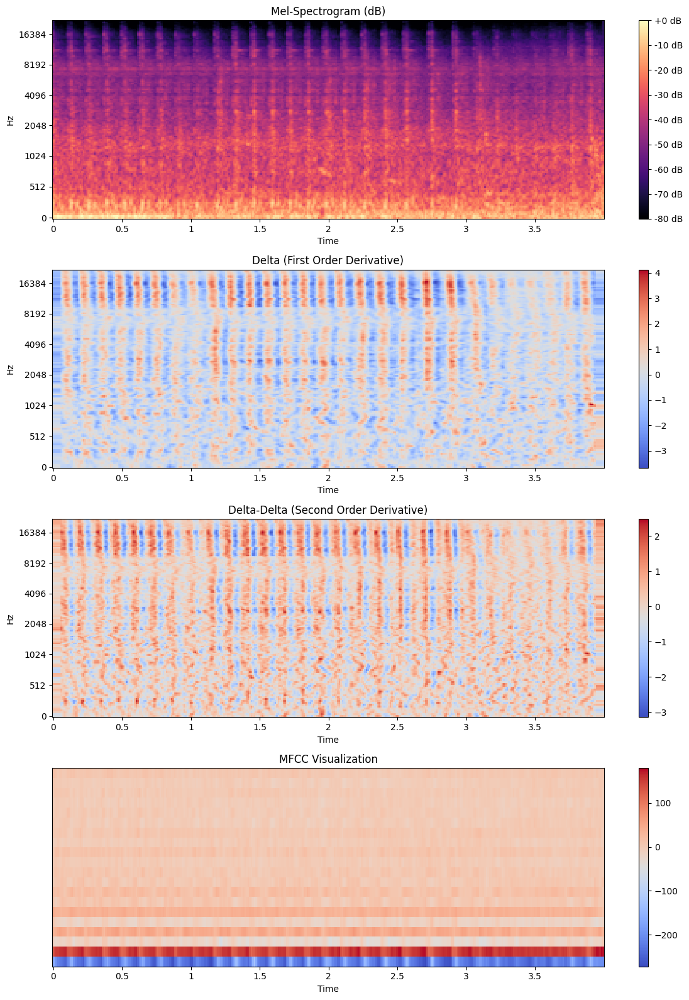

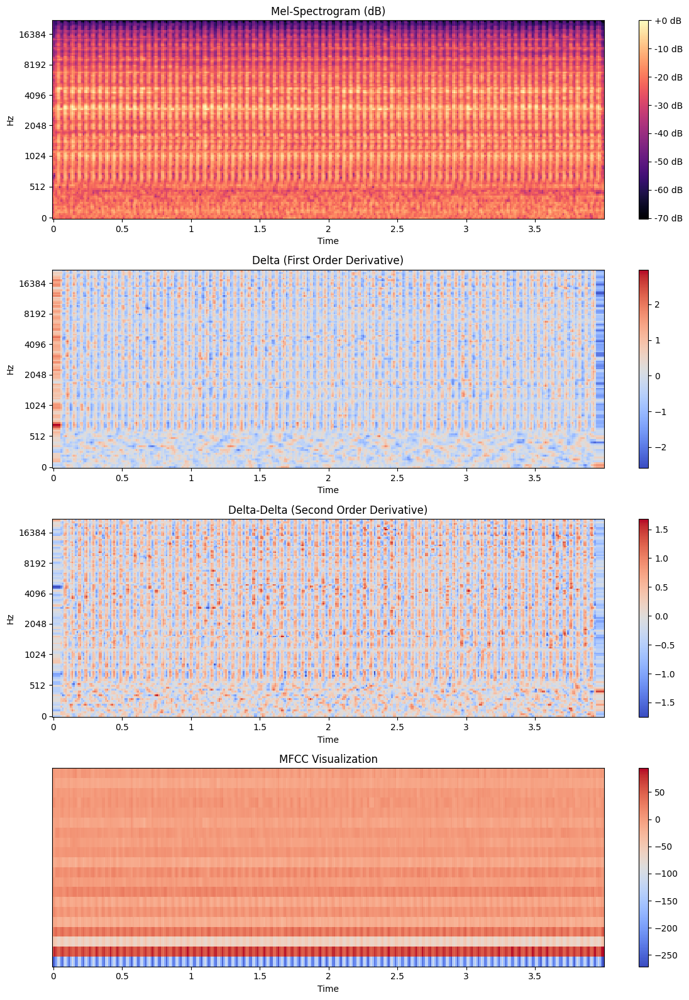

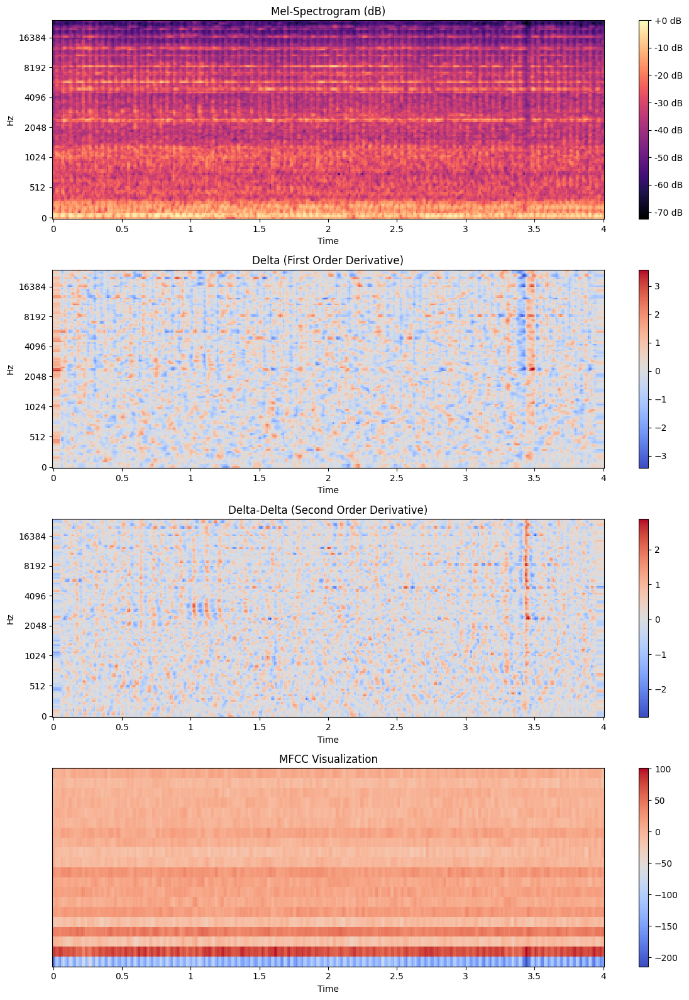

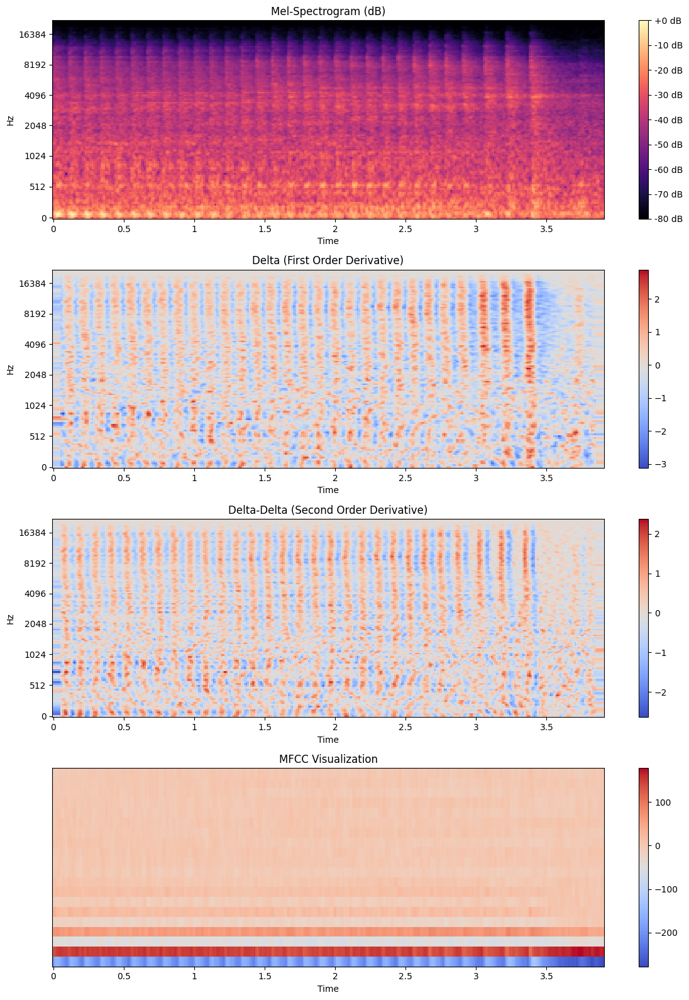

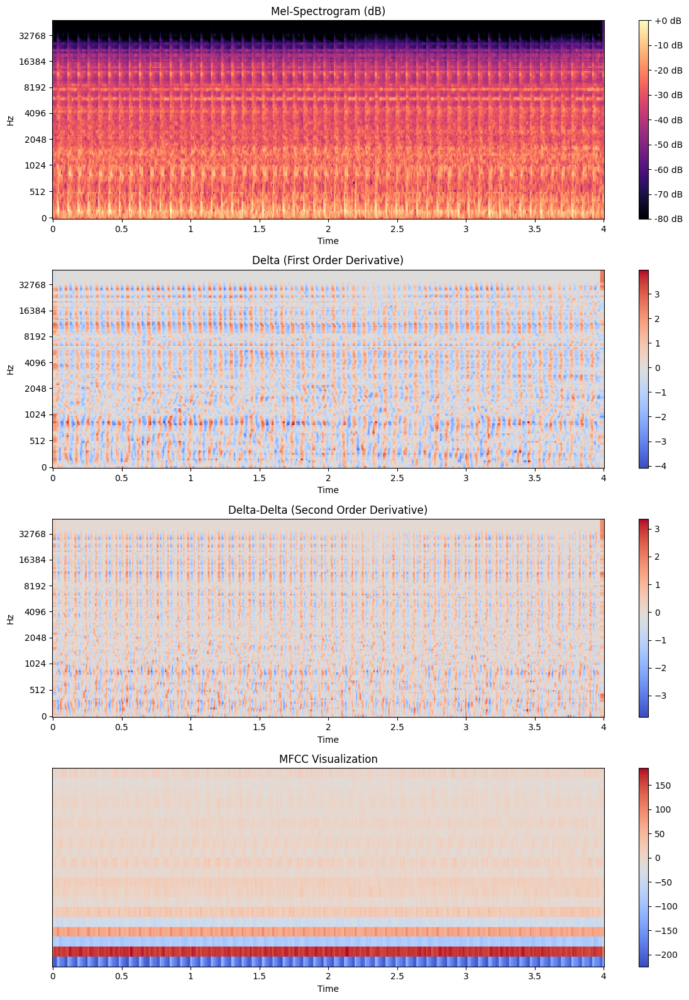

In [ ]:
plot_random_audio_features('jackhammer', 5, metadata, AUDIO_DIR)

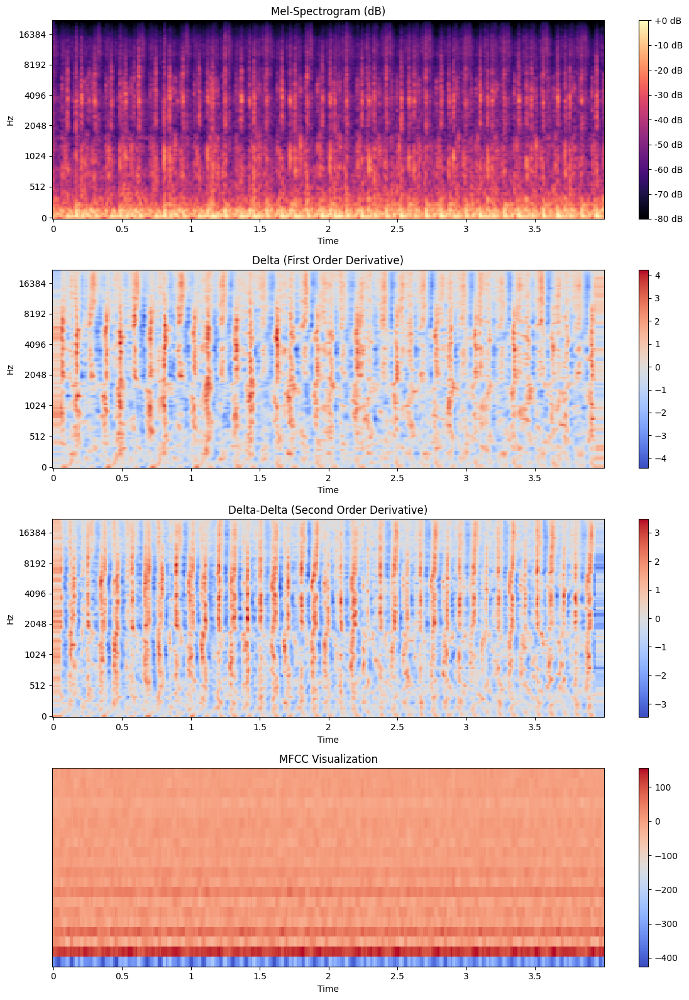

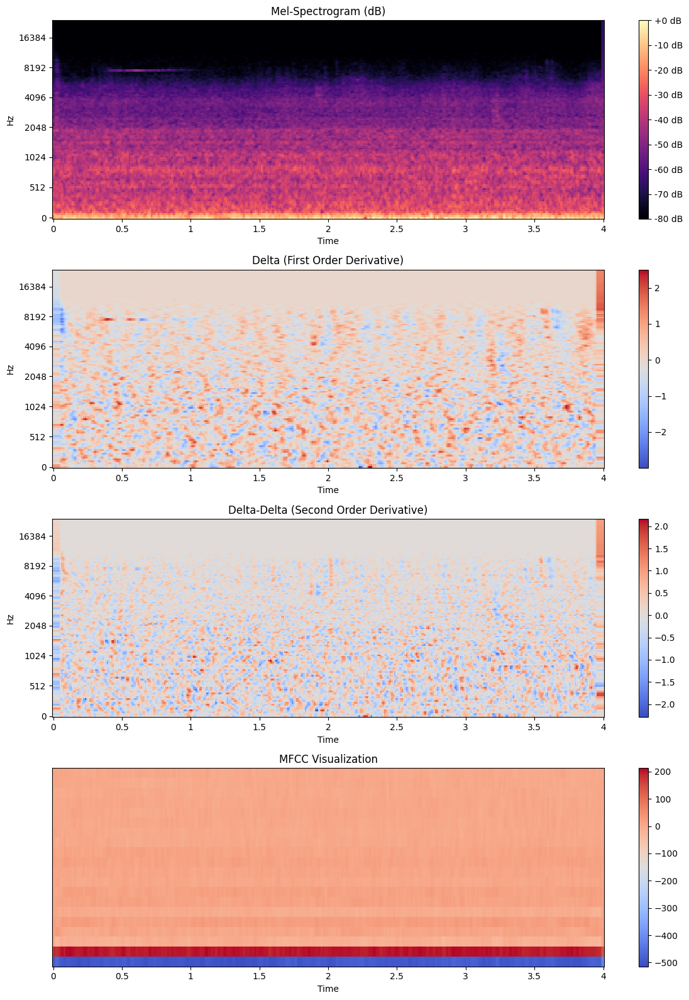

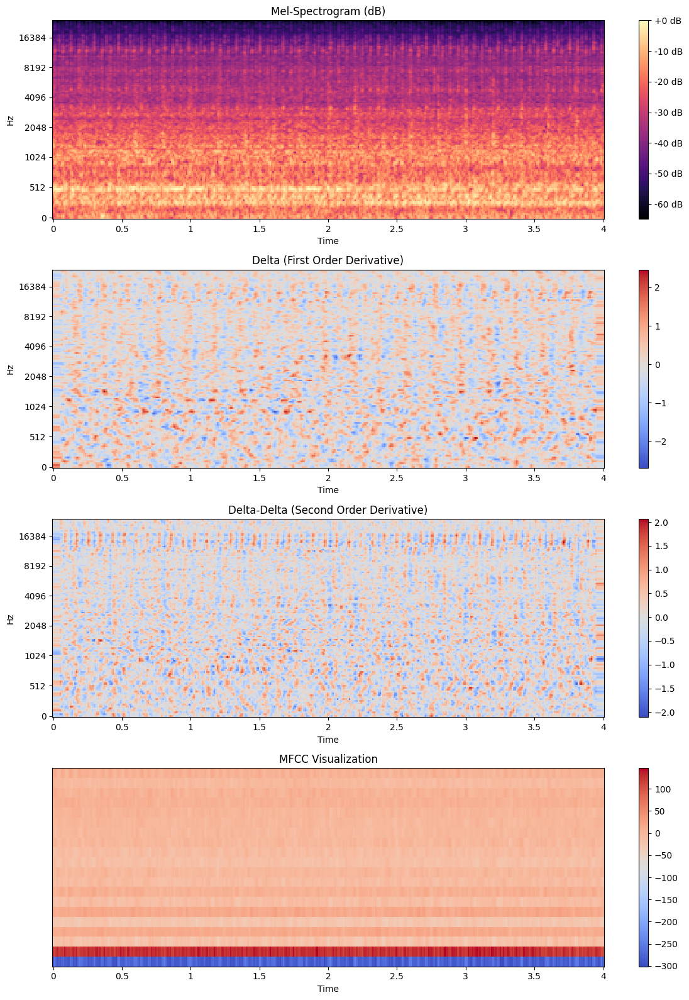

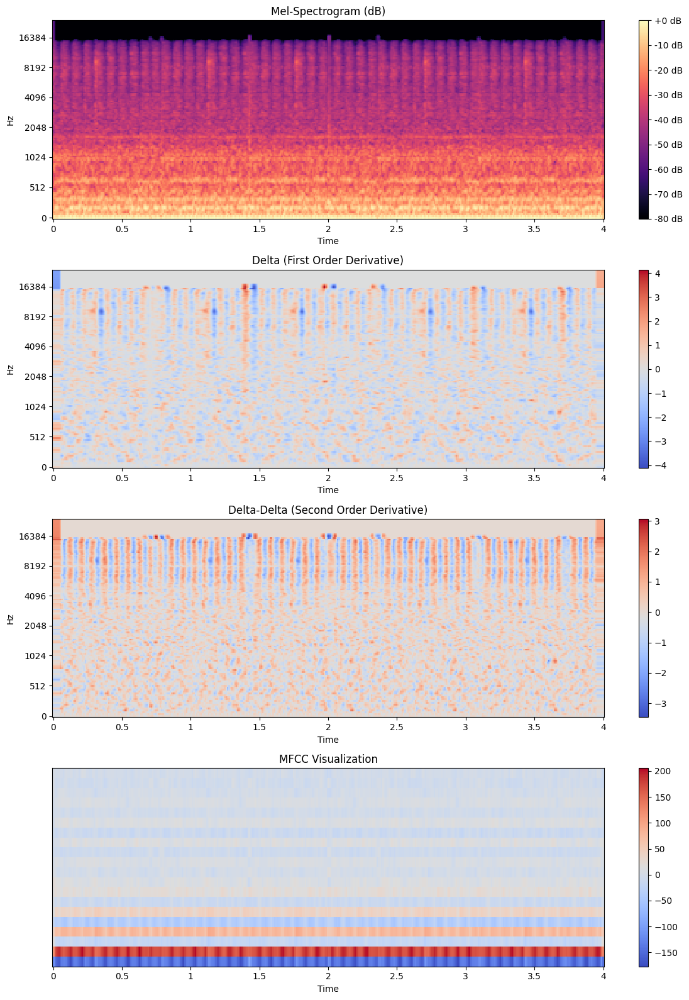

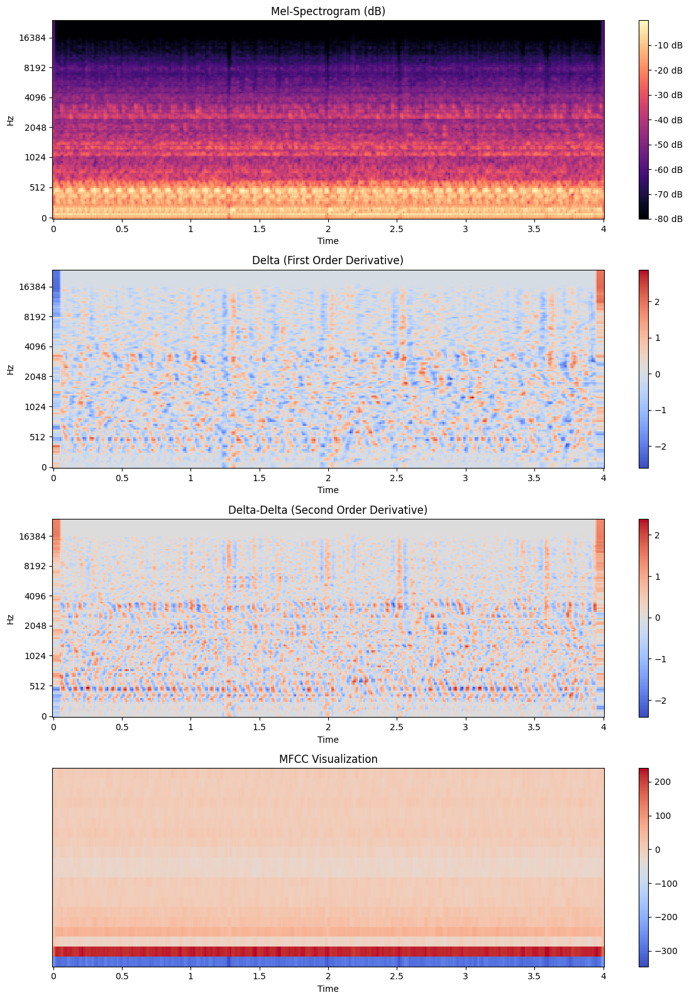

In [ ]:
plot_random_audio_features('engine_idling', 5, metadata, AUDIO_DIR)

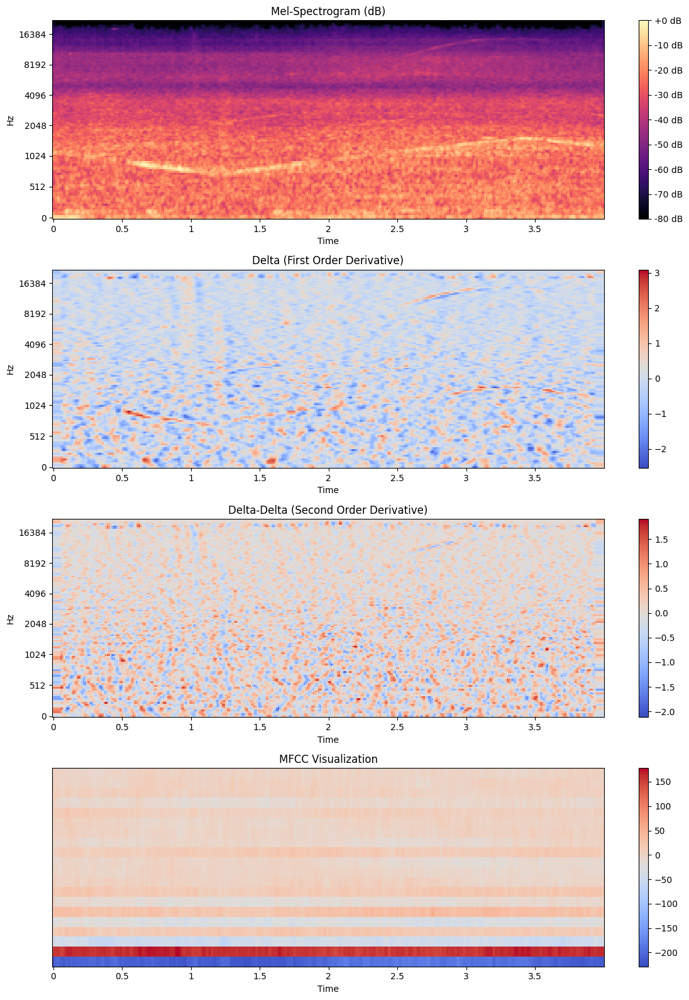

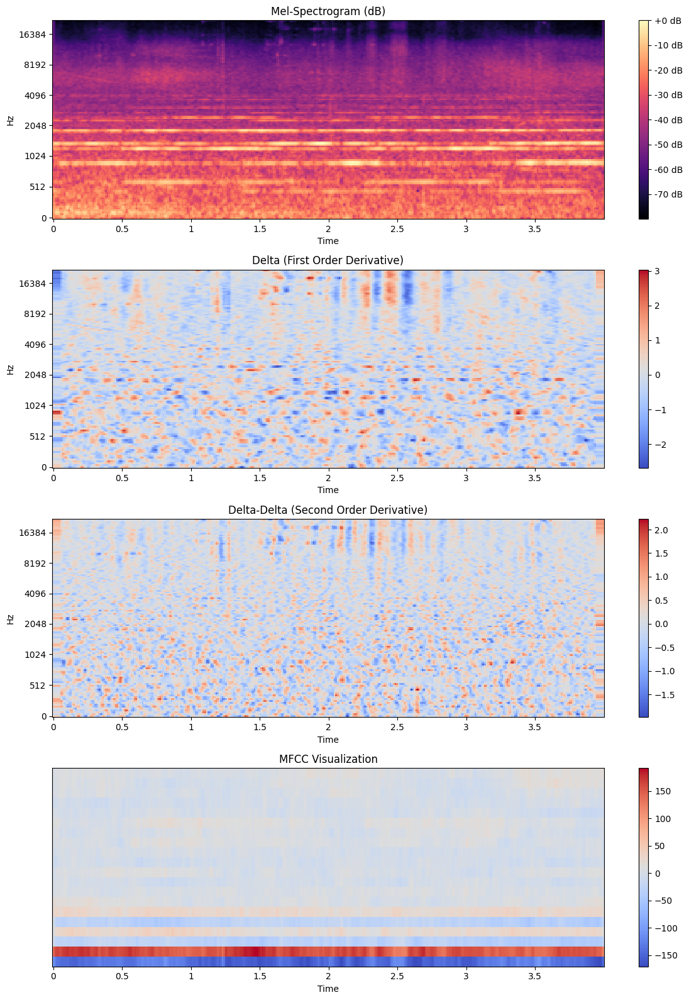

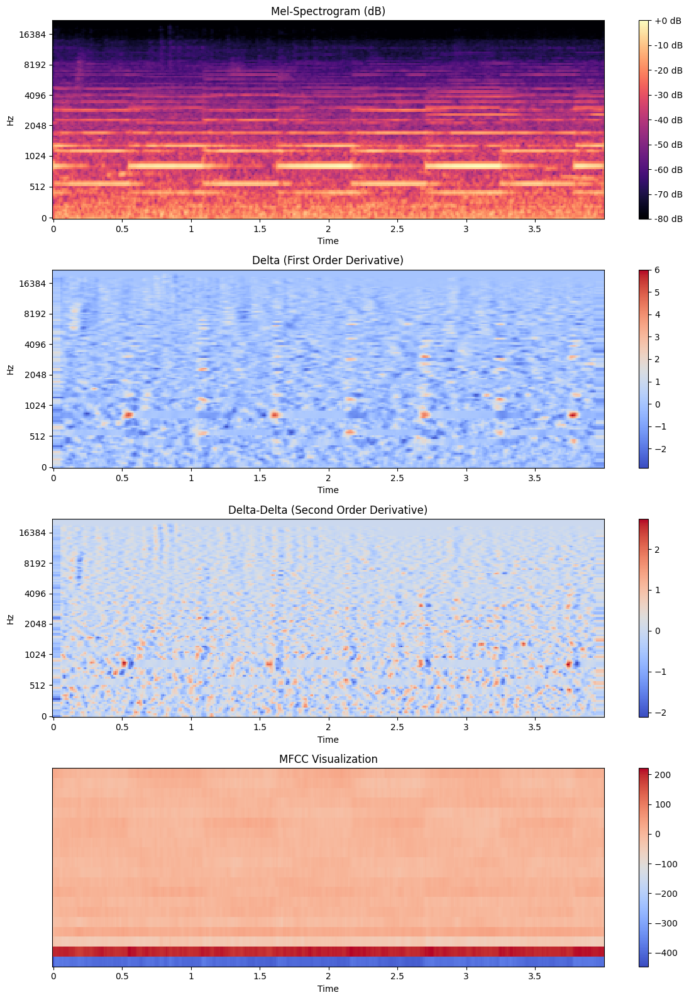

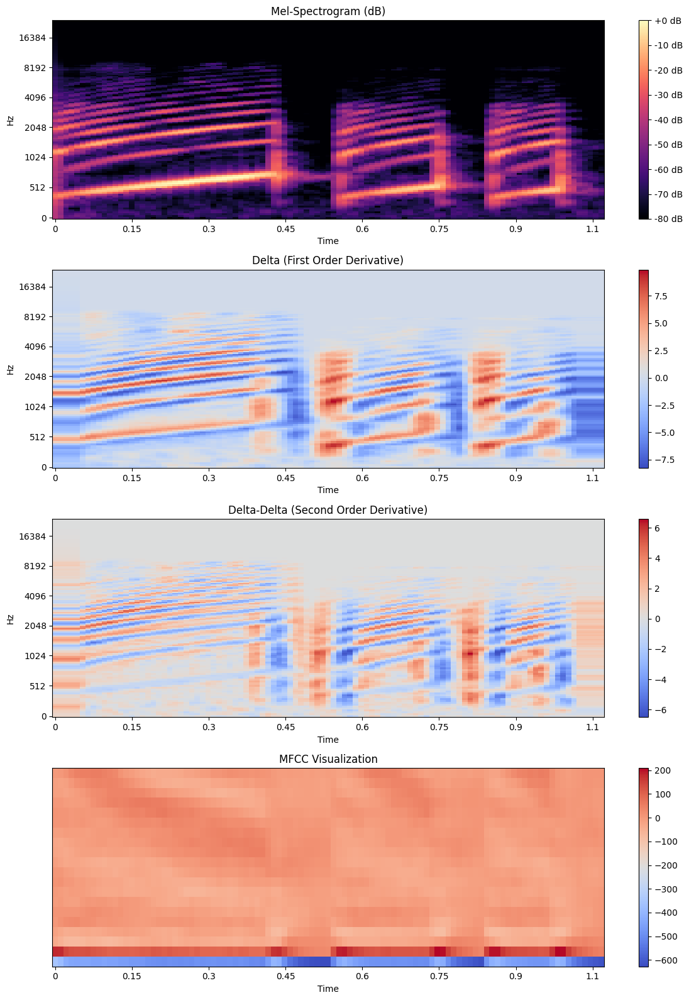

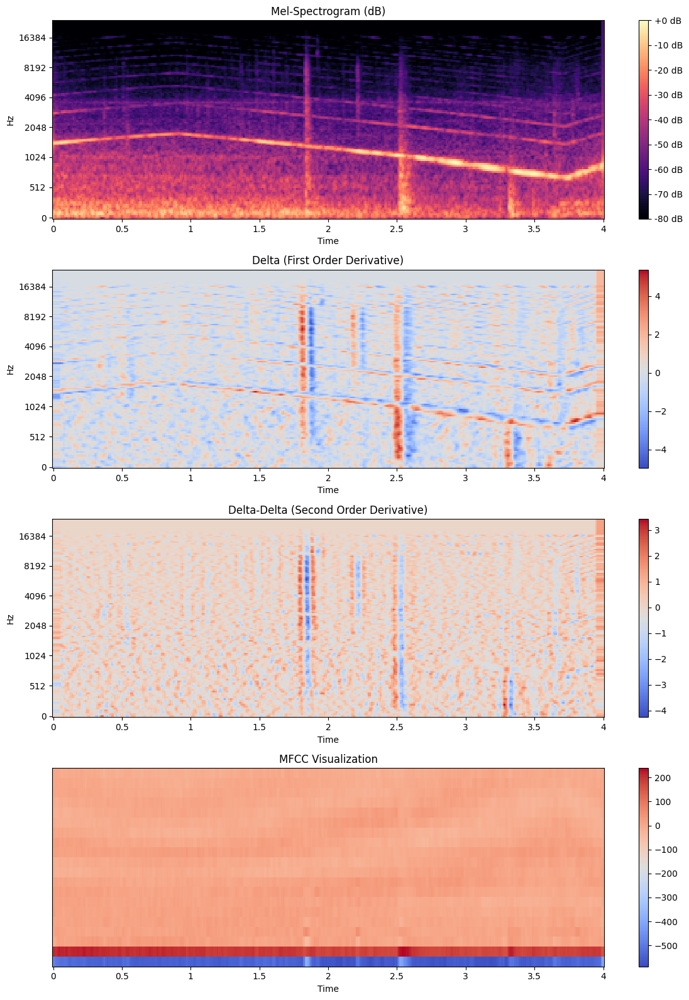

In [ ]:
plot_random_audio_features('siren', 5, metadata, AUDIO_DIR)

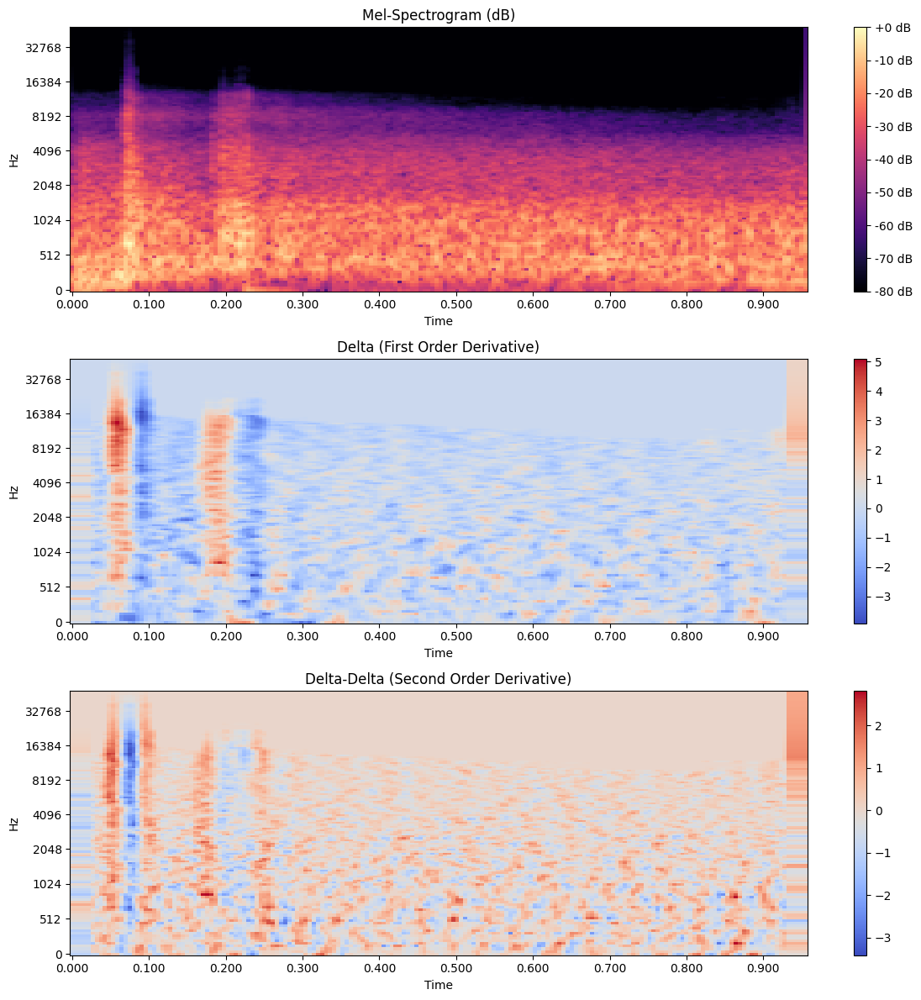

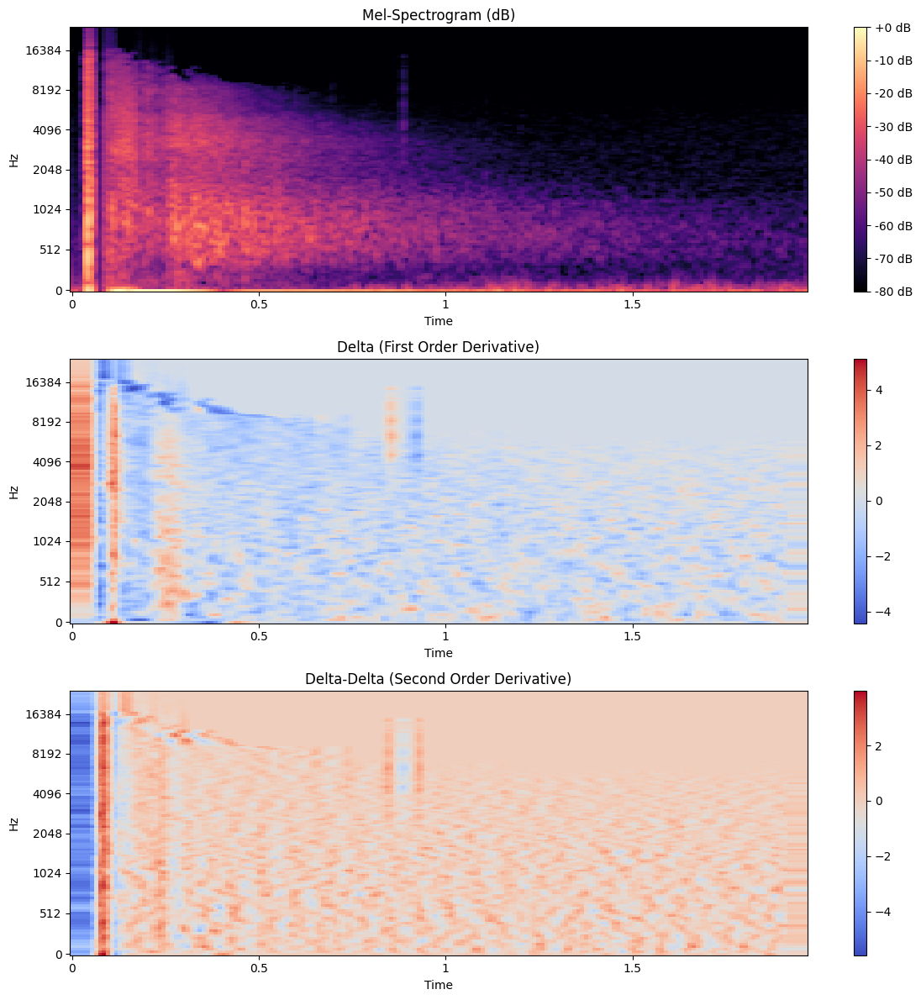

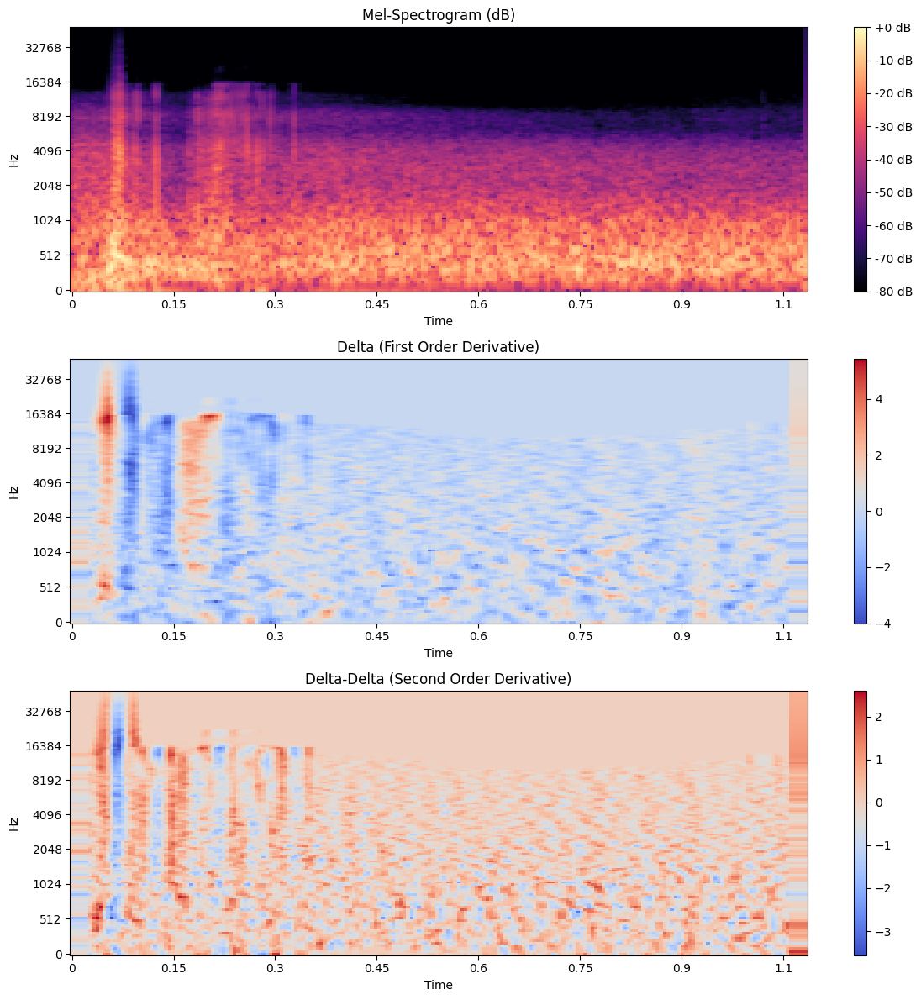

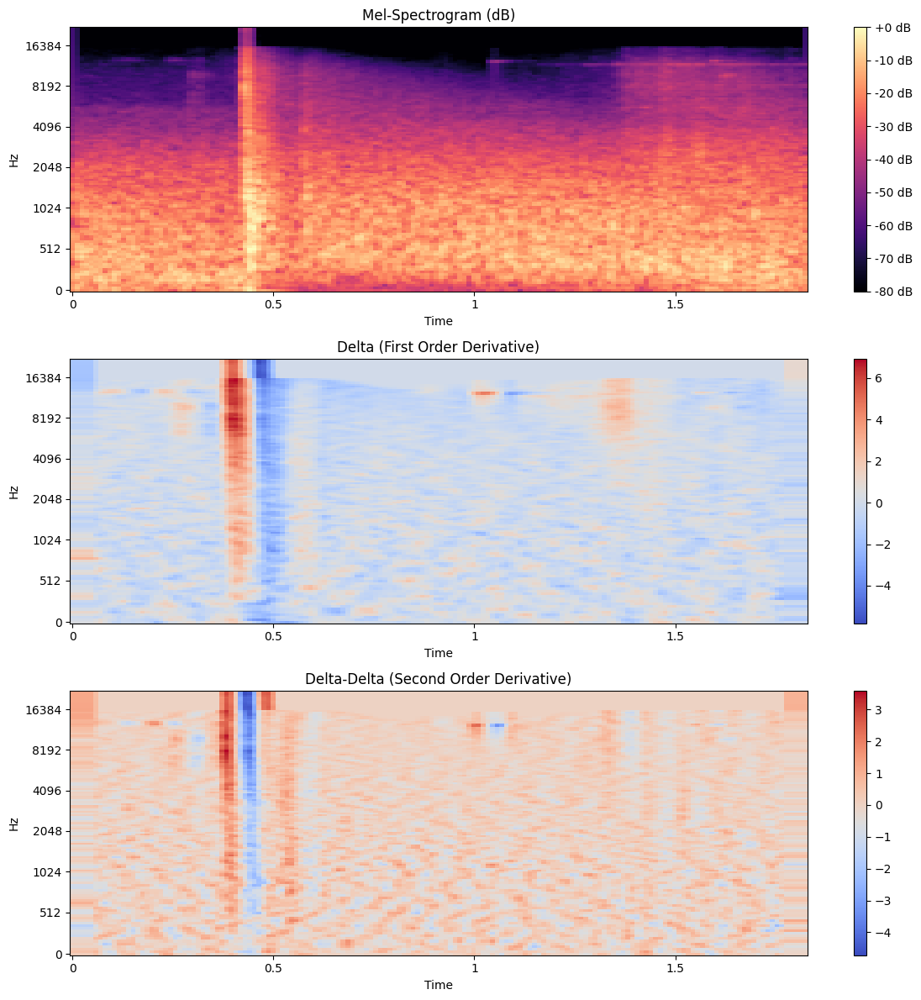

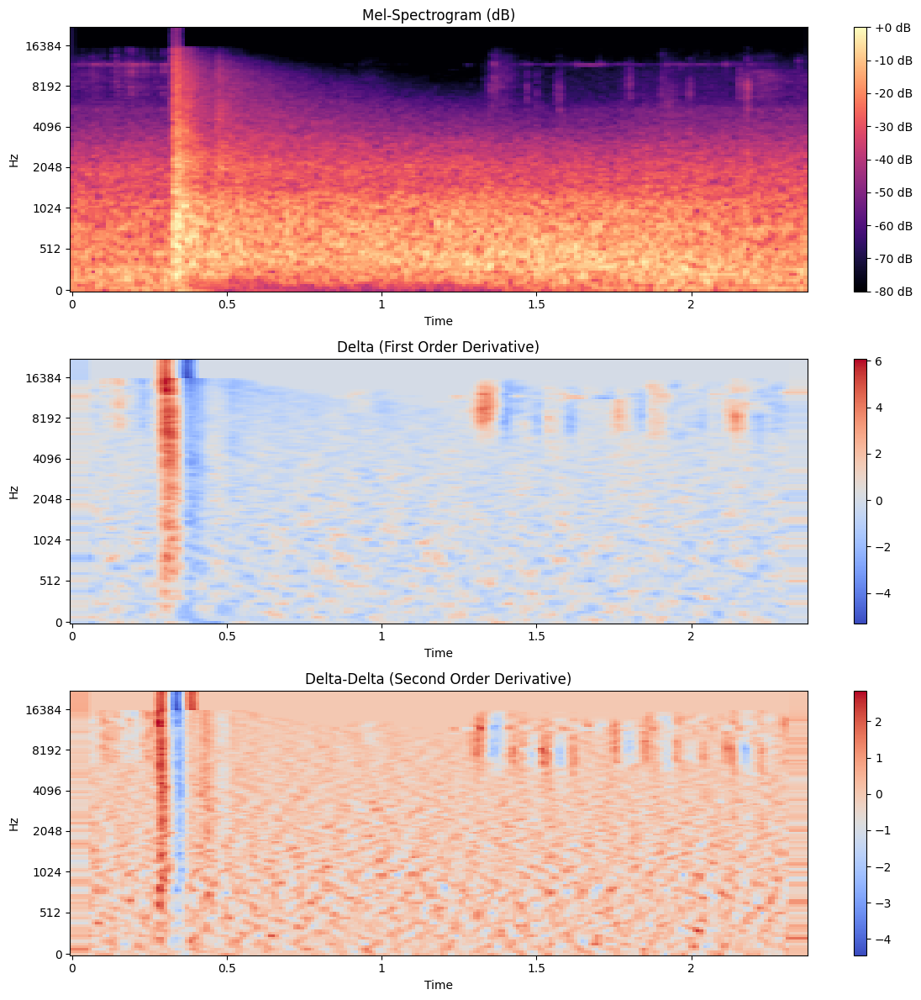

In [ ]:
plot_random_audio_features('gun_shot', 5, metadata, AUDIO_DIR)

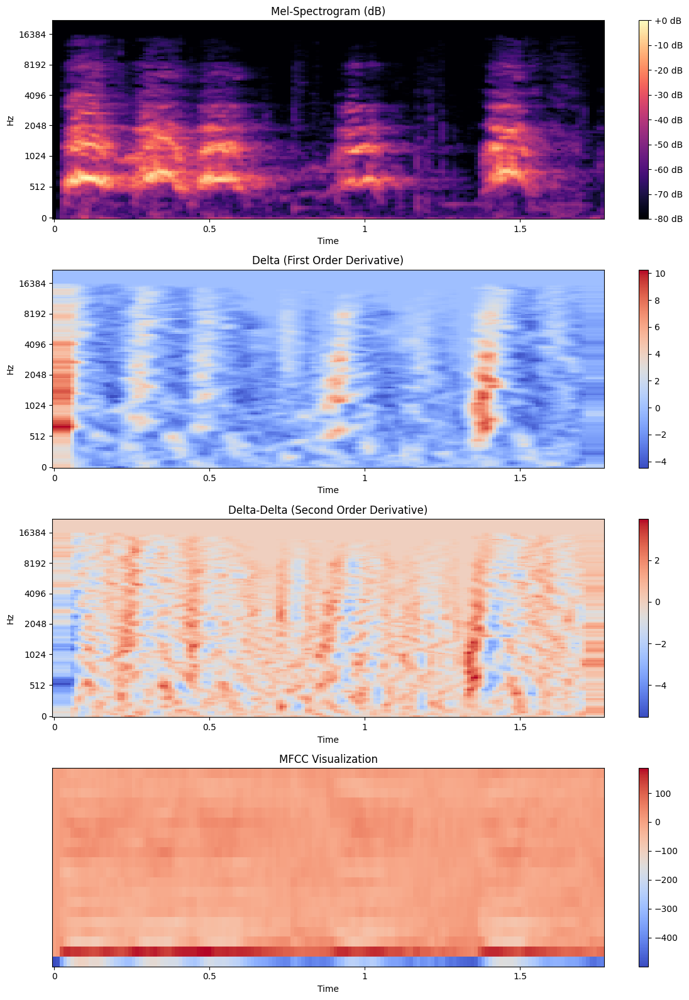

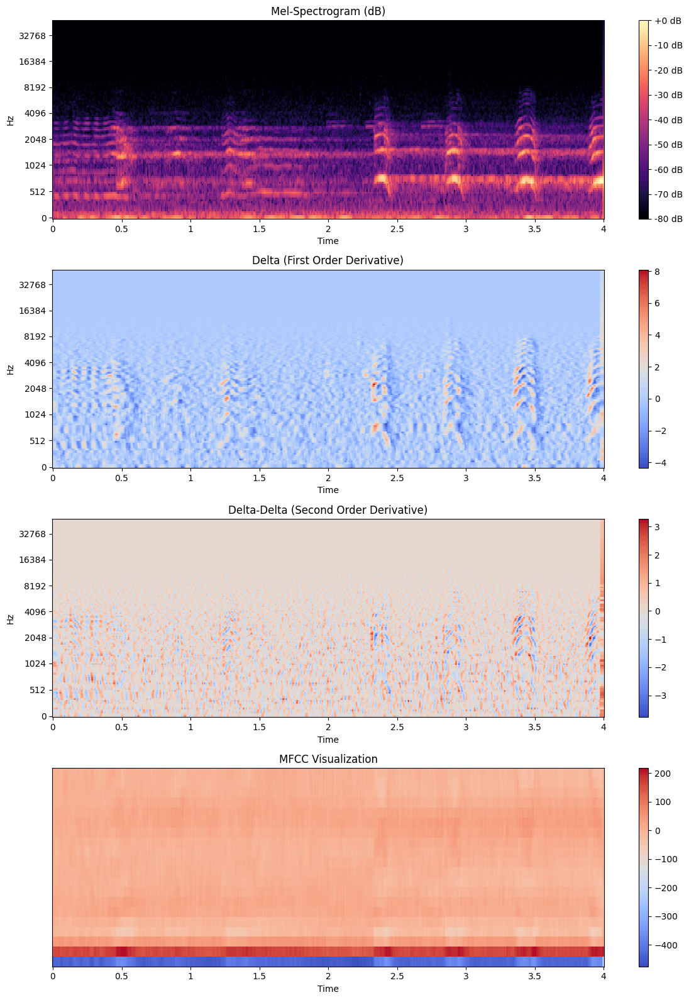

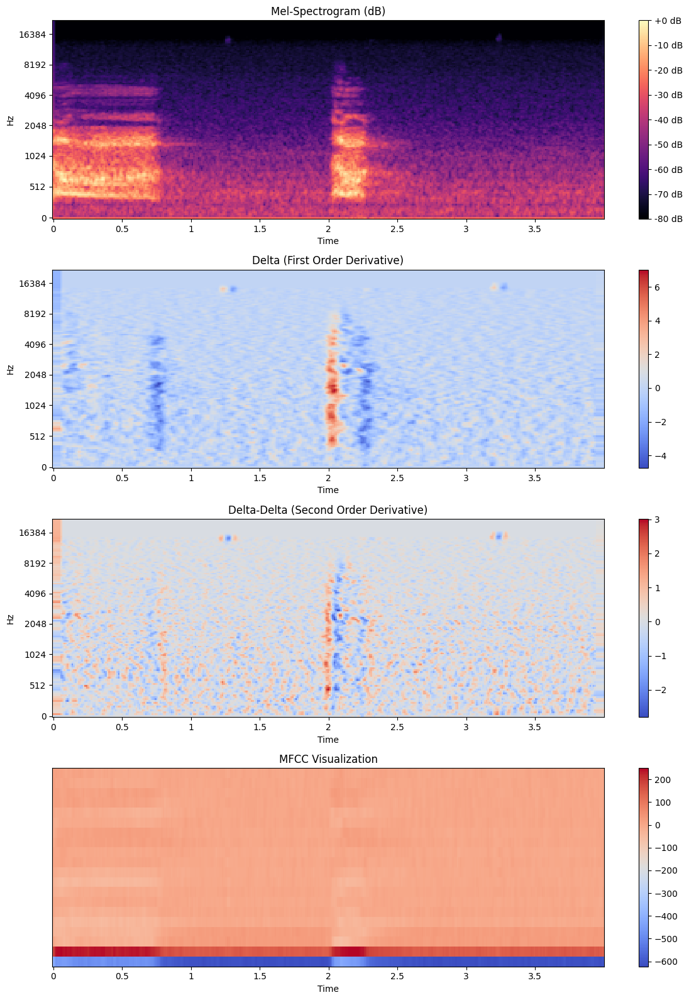

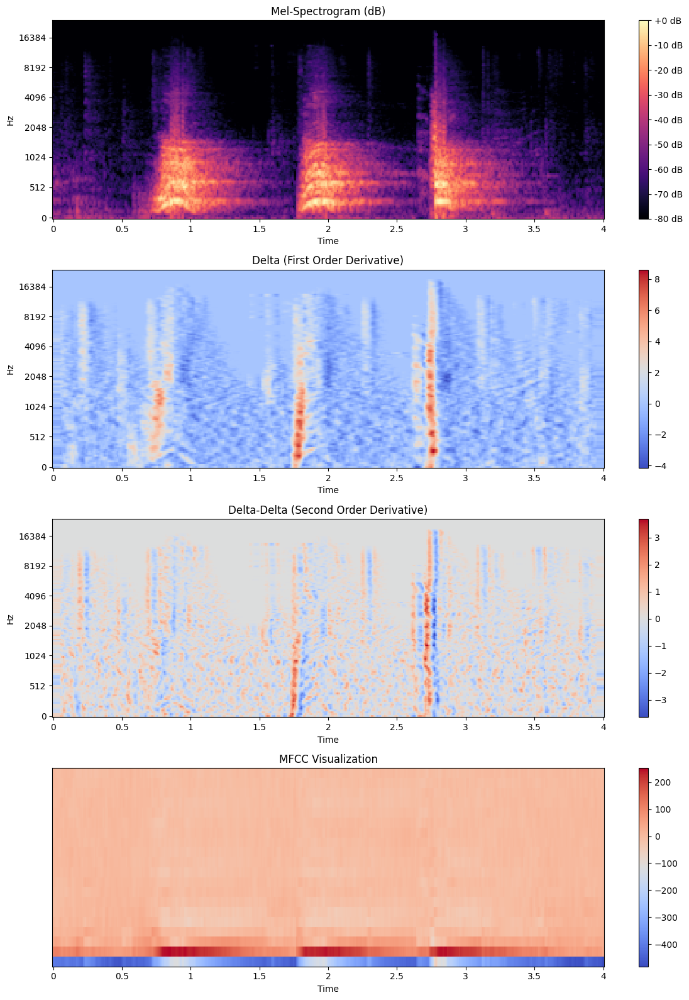

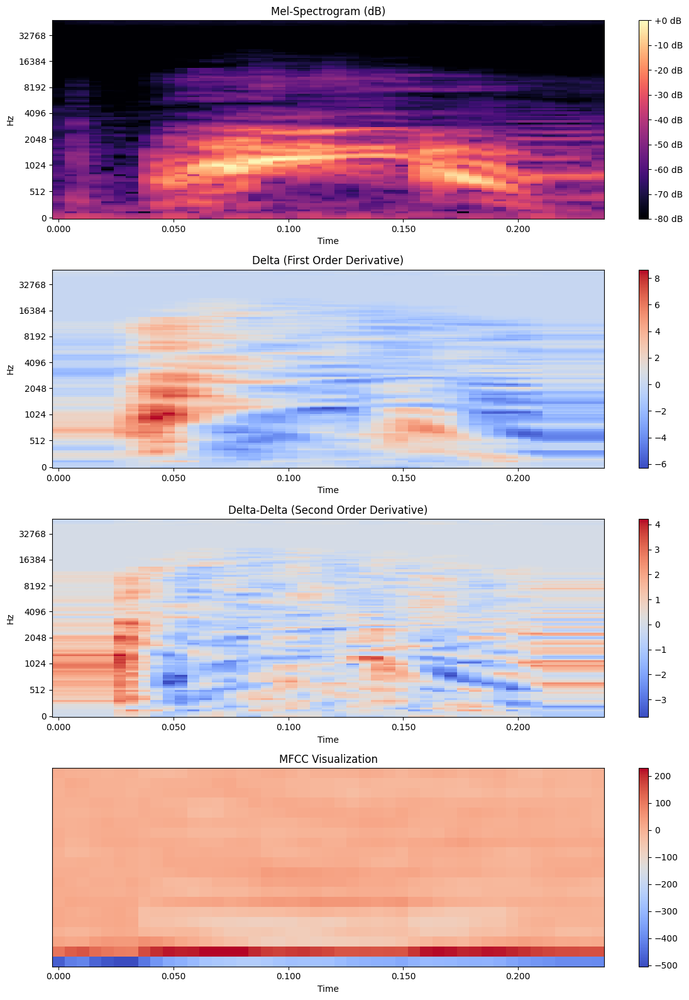

In [ ]:
plot_random_audio_features('dog_bark', 5, metadata, AUDIO_DIR)